# 합성곱 신경망(Convolutional Neural Networks, CNNs)

- 이미지 인식, 음성 인식 등에 자주 사용되는데,  
  특히, 이미지 인식 분야에서 거의 모든 딥러닝 기술에 사용

<br>

## 컨볼루션 신경망의 등장
- 1989년 얀 르쿤(Yann LeCun) 교수의 논문에서 발표

  - 필기체 인식에서 의미가 있었지만 범용화하는데에는 무리

- 1998년, "Gradient-Based Learning Applied to Document Recognition"이라는 논문에서 LeNet-5 제시

- 합성곱 층(convolution layer), 풀링 층(pooling layer) 소개
  <br>

  <img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>


## 완전연결계층과의 차이
- 완전연결계층(Fully-Connected Layer)은 이미지와 같은 데이터의 형상(3차원)을 무시함  

- 모든 입력데이터를 동등하게 취급  
  즉, **데이터의 특징을 잃어버리게 됨**

- 컨볼루션층(convolution layer)은 <u>**이미지 픽셀 사이의 관계를 고려**</u>

- 완전연결계층은 공간정보를 손실하지만, 컨볼루션층은 공간정보를 유지  
  - 이미지와 같은 2차원(흑백) 또는 3차원(컬러)의 형상을 유지

  - 공간정보를 유지하기 때문에 완전연결계층에 비해 적은 수의 파라미터를 요구


## 컨볼루션 신경망 구조 예시

<img src="https://www.oreilly.com/library/view/neural-network-projects/9781789138900/assets/c38754ca-f2ea-425a-b7a6-1fe0f2f5074e.png" width="600">

<sub>출처: https://www.oreilly.com/library/view/neural-network-projects/9781789138900/8e87ad66-6de3-4275-81a4-62b54436bf16.xhtml</sub>



## 합성곱 연산
- 필터(filter) 연산
  - 입력 데이터에 필터를 통한 어떠한 연산을 진행
  
  - **필터에 대응하는 원소끼리 곱하고, 그 합을 구함**

  - 연산이 완료된 결과 데이터를 **특징 맵(feature map)**이라 부름

- 필터(filter)
  - 커널(kernel)이라고도 칭함
  
  - 흔히 사진 어플에서 사용하는 '이미지 필터'와 비슷한 개념

  - 필터의 사이즈는 "거의 항상 홀수"
    - 짝수이면 패딩이 비대칭이 되어버림
  
    - 왼쪽, 오른쪽을 다르게 주어야함
  
    - 중심위치가 존재, 즉 구별된 하나의 픽셀(중심 픽셀)이 존재

  - 필터의 학습 파라미터 개수는 입력 데이터의 크기와 상관없이 일정  
    따라서, 과적합을 방지할 수 있음

  <br>
  <img src="http://deeplearning.net/software/theano_versions/dev/_images/numerical_no_padding_no_strides.gif">

  <sub>출처: http://deeplearning.net/software/theano_versions/dev/tutorial/conv_arithmetic.html</sub>


- 연산 시각화
  <img src="https://www.researchgate.net/profile/Ihab_S_Mohamed/publication/324165524/figure/fig3/AS:611103423860736@1522709818959/An-example-of-convolution-operation-in-2D-2.png" width="500">

  <sub>출처: https://www.researchgate.net/figure/An-example-of-convolution-operation-in-2D-2_fig3_324165524</sub>


- 일반적으로, 합성곱 연산을 한 후의 데이터 사이즈는  
  ### $\quad (n-f+1) \times (n-f+1)$
    $n$: 입력 데이터의 크기  
    $f$: 필터(커널)의 크기


  <img src="https://miro.medium.com/max/1400/1*Fw-ehcNBR9byHtho-Rxbtw.gif" width="400">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>
  
  위 예에서 입력 데이터 크기($n$)는 5, 필터의 크기($k$)는 3이므로  
  출력 데이터의 크기는 $(5 - 3 + 1) = 3$


## 패딩(padding)과 스트라이드(stride)
- 필터(커널) 사이즈과 함께 **입력 이미지와 출력 이미지의 사이즈를 결정**하기 위해 사용

- 사용자가 결정할 수 있음



### 패딩
- 입력 데이터의 주변을 특정 값으로 채우는 기법
  - 주로 0으로 많이 채움

  <img src="http://deeplearning.net/software/theano_versions/dev/_images/arbitrary_padding_no_strides.gif" width="300">

- 출력 데이터의 크기
  ### $\quad (n+2p-f+1) \times (n+2p-f+1)$

  위 그림에서, 입력 데이터의 크기($n$)는 5, 필터의 크기($f$)는 4, 패딩값($p$)은 2이므로    
  출력 데이터의 크기는 ($5 + 2\times 2 - 4 + 1) = 6$

### 'valid' 와 'same'
- 'valid'
  - 패딩을 주지 않음
  - padding=0 (0으로 채워진 테두리가 아니라 패딩을 주지 않는다는 의미)

- 'same'
  - 패딩을 주어 입력 이미지의 크기와 연산 후의 이미지 크기를 같게함

  - 만약, 필터(커널)의 크기가 $k$ 이면,  
    패딩의 크기는 $p = \frac{k-1}{2}$ (단, <u>stride=1)</u>



### 스트라이드
- 필터를 적용하는 간격을 의미

- 아래는 그림의 간격 2

  <img src="http://deeplearning.net/software/theano_versions/dev/_images/no_padding_strides.gif">


## 출력 데이터의 크기

## $\qquad OH = \frac{H + 2P - FH}{S} + 1 $
## $\qquad OW = \frac{W + 2P - FW}{S} + 1 $

- 입력 크기 : $(H, W)$

- 필터 크기 : $(FH, FW)$

- 출력 크기 : $(OH, OW)$

- 패딩, 스트라이드 : $P, S$

- (주의)
  - 위 식의 값에서 $\frac{H + 2P - FH}{S}$ 또는 $\frac{W + 2P - FW}{S}$가 정수로 나누어 떨어지는 값이어야 함
  - 만약, 정수로 나누어 떨어지지 않으면  
    패딩, 스트라이드값을 조정하여 정수로 나누어 떨어지게 해야함


## 풀링(Pooling)

- 필터(커널) 사이즈 내에서 특정 값을 추출하는 과정

### 맥스 풀링(Max Pooling)
- 가장 많이 사용되는 방법

- 출력 데이터의 사이즈 계산은 컨볼루션 연산과 동일
## $\quad OH = \frac{H + 2P - FH}{S} + 1 $
## $\quad OW = \frac{W + 2P - FW}{S} + 1 $

- 일반적으로 stride=2, kernel_size=2 를 통해  
  **특징맵의 크기를 <u>절반으로 줄이는 역할</u>**

- 모델이 물체의 주요한 특징을 학습할 수 있도록 해주며,  
  컨볼루션 신경망이 이동 불변성 특성을 가지게 해줌
  - 예를 들어, 아래의 그림에서 초록색 사각형 안에 있는  
    2와 8의 위치를 바꾼다해도 맥스 풀링 연산은 8을 추출

- 모델의 파라미터 개수를 줄여주고, 연산 속도를 빠르게 해줌

  <br>

  <img src="https://cs231n.github.io/assets/cnn/maxpool.jpeg" width="600">

  <sub>출처: https://cs231n.github.io/convolutional-networks/</sub>

### 평균 풀링(Avg Pooling)

- 필터 내의 있는 픽셀값의 평균을 구하는 과정

- 과거에 많이 사용, 요즘은 잘 사용되지 않는다.

- 맥스풀링과 마찬가지로 stride=2, kernel_size=2 를 통해  
  특징 맵의 사이즈를 줄이는 역할

  <img src="https://www.researchgate.net/profile/Juan_Pedro_Dominguez-Morales/publication/329885401/figure/fig21/AS:707709083062277@1545742402308/Average-pooling-example.png" width="600">

  <sub>출처: https://www.researchgate.net/figure/Average-pooling-example_fig21_329885401</sub>

## 합성곱 연산의 의미

## 2차원 이미지에 대한 필터 연산 예시
  - 가장 자리 검출(Edge-Detection)

  - 소벨 필터(Sobel Filter)

    - Horizontal : 가로 방향의 미분을 구하는 필터 역할

    - Vertical : 세로 방향의 미분을 구하는 필터 역할  

  <img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT_ZRkuiCkv0ZEHFiyCp-7Y5bCL0liaYSQ4mg&usqp=CAU" width="350">

  <sub>출처: https://www.cloras.com/blog/image-recognition/</sub>


### modules import

In [1]:
import cv2  #
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread
import urllib  #
import requests  #
from PIL import Image #
from io import BytesIO


### util functions

In [2]:
def url_to_image(url, gray=False):
    resp = urllib.request.urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")

    if gray:
        image = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)
    else:
        image = cv2.imdecode(image, cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def filtered_image(image, filter, output_size):
    filtered_image = np.zeros((output_size, output_size))
    filter_size = filter.shape[0]

    for i in range(output_size):
        for j in range(output_size):
            multiply_values = image[i:(i+filter_size), j:(j+filter_size)] * filter
            sum_value = np.sum(multiply_values)

            if (sum_value > 255):
                sum_value = 255
            filtered_image[i, j] = sum_value

    return filtered_image

### 이미지 확인
- 예시이므로 정사각형 사이즈로 진행

img shape: (440, 440)


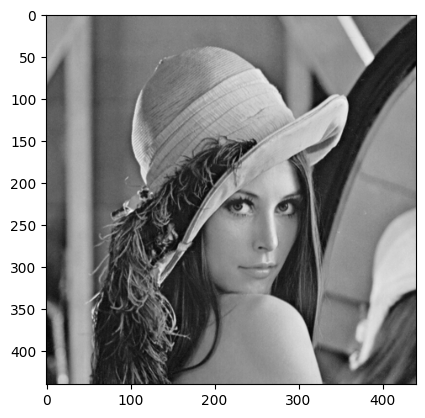

In [3]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img = url_to_image(img_url, gray=True)
print('img shape:', img.shape)
plt.imshow(img, cmap='gray')
plt.show()



# img = imread('C:/Users/user/Downloads/deep-learning-from-scratch-master/dataset/lena_gray.png') # 각자의 경로로 수정해주세요.
# plt.imshow(img.T, cmap=plt.cm.gray)
# plt.axis('off')
# plt.show()



### 필터연산 적용

output size: 438


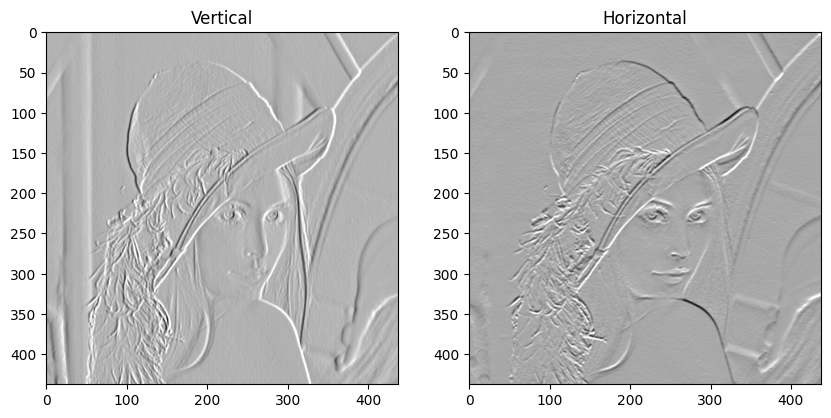

In [4]:
horizontal_filter = np.array([[1., 2., 1.],
                            [0., 0., 0.],
                            [-1., -2., -1.]])

vertical_filter = np.array([[1., 0., -1.],
                              [2., 0., -2.],
                              [1., 0., -1.]])

output_size = int((img.shape[0] - 3) / 1+1)
print('output size:', output_size)

vertical_filtered = filtered_image(img, vertical_filter, output_size)
horizontal_filtered = filtered_image(img, horizontal_filter, output_size)

plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.title('Vertical')
plt.imshow(vertical_filtered, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Horizontal')
plt.imshow(horizontal_filtered, cmap='gray')
plt.show()

### 이미지 필터를 적용한 최종 결과

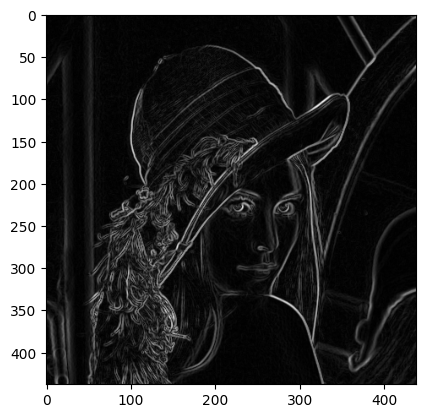

In [5]:
sobel_img = np.sqrt(np.square(horizontal_filtered) + np.square(vertical_filtered))

plt.imshow(sobel_img, cmap='gray')
plt.show()

## 3차원 데이터의 합성곱 연산
- **이미지는 3차원으로 구성**
  - (가로, 세로, 채널 수)
  - 채널 : RGB

- 색상값의 정도에 따라 color색 결정

  <img src="https://www.projectorcentral.com/images/articles/RGB-Explained-600.jpg">

  <sub>출처: https://www.projectorcentral.com/All-About-Bit-Depth.htm?page=What-Bit-Depth-Looks-Like</sub>

### 아래의 이미지 확인은 참고사항

img shape: (440, 440, 3)


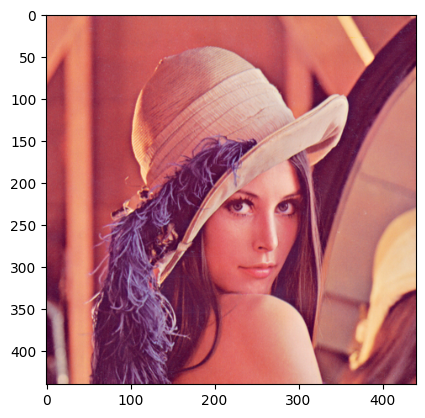

In [6]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img = url_to_image(img_url)
print('img shape:', img.shape)
plt.imshow(img)
plt.show()

In [7]:
image_copy = img.copy()
image_copy[:, :, 1] = 0
image_copy[:, :, 2] = 0
image_red = image_copy

print(image_red)

[[[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [233   0   0]
  [224   0   0]
  [202   0   0]]

 [[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [233   0   0]
  [224   0   0]
  [202   0   0]]

 [[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [232   0   0]
  [223   0   0]
  [201   0   0]]

 ...

 [[ 84   0   0]
  [ 86   0   0]
  [ 93   0   0]
  ...
  [174   0   0]
  [169   0   0]
  [172   0   0]]

 [[ 82   0   0]
  [ 86   0   0]
  [ 95   0   0]
  ...
  [177   0   0]
  [178   0   0]
  [183   0   0]]

 [[ 81   0   0]
  [ 86   0   0]
  [ 96   0   0]
  ...
  [178   0   0]
  [181   0   0]
  [185   0   0]]]


In [8]:
image_copy = img.copy()
image_copy[:, :, 0] = 0
image_copy[:, :, 2] = 0
image_green = image_copy

In [9]:
image_copy = img.copy()
image_copy[:, :, 0] = 0
image_copy[:, :, 1] = 0
image_blue = image_copy

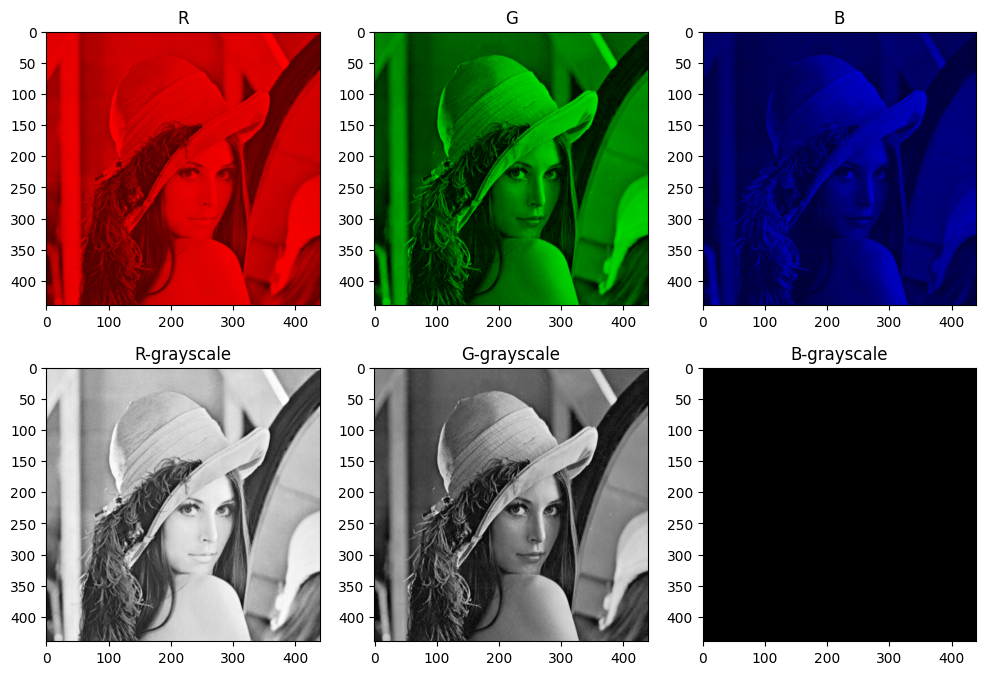

In [10]:
fig = plt.figure(figsize=(12, 8))

title_list = ['R', 'G', 'B', 'R-grayscale', 'G-grayscale', 'B-grayscale']
image_list = [image_red, image_green, image_blue, image_red[:, :, 0], image_green[:, :, 1], image_green[:, :, 2]]

for i, image in enumerate(image_list):
    ax = fig.add_subplot(2, 3, i+1)
    ax.title.set_text('{}'.format(title_list[i]))

    if i >= 3:
      plt.imshow(image, cmap='gray')
    else:
      plt.imshow(image)

plt.show()

### 연산 과정

- 각 채널마다 컨볼루션 연산을 적용
  - 3채널을 모두 합쳐서 '하나의 필터'라고 칭함  
    
  <img src="https://miro.medium.com/max/2000/1*8dx6nxpUh2JqvYWPadTwMQ.gif" width="600">

<br>

- 각각의 결과를 더함  
  
  <img src="https://miro.medium.com/max/2000/1*CYB2dyR3EhFs1xNLK8ewiA.gif" width="600">

<br>

- 더한 결과에 편향을 더함  
  <img src="https://miro.medium.com/max/588/1*RYYucIh3U-YFxrIkyQKzRw.gif" width="300">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>



### util functions

In [11]:
def conv_op(image, kernel, pad=0, stride=1):
  H, W, C = image.shape
  kernel_size = kernel.shape[0]

  out_h = (H + 2*pad - kernel_size) // stride + 1
  out_w = (W + 2*pad - kernel_size) // stride + 1

  filtered_img = np.zeros((out_h, out_w))
  pad_img = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), 'constant')

  for i in range(out_h):
    for j in range(out_w):
      for c in range(C):
        multiply_values = pad_img[i*stride:(i*stride+kernel_size), j*stride:(j*stride+kernel_size)] * kernel
        sum_value = np.sum(multiply_values)
        filtered_img[i, j] = sum_value

  filtered_img = filtered_img.reshape(1, out_h, out_w, -1).transpose(0, 3, 1, 2)

  return filtered_img.astype(np.uint8)


### 이미지 확인

img shape: (440, 440, 3)


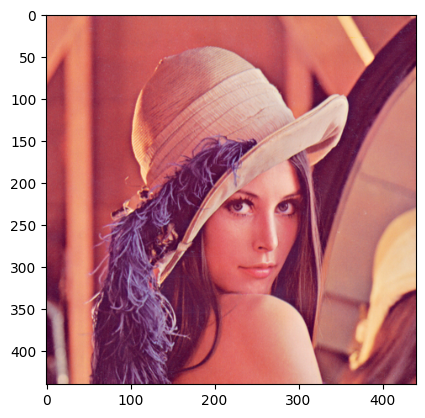

In [12]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img = url_to_image(img_url)
print('img shape:', img.shape)
plt.imshow(img)
plt.show()

### 필터연산 적용
- 3x3 크기의 3채널 필터 5개

- (5, 3, 3, 3) ----> (5개, 3채널, 세로, 가로)

In [13]:
filter1 = np.random.rand(3, 3, 3)
print(filter1.shape)
print(filter1)

(3, 3, 3)
[[[0.21271606 0.65847871 0.80354757]
  [0.3785618  0.5592414  0.31862271]
  [0.85458329 0.12272712 0.87610751]]

 [[0.92972219 0.00886995 0.29303821]
  [0.44708355 0.80827929 0.57532207]
  [0.13934631 0.34749384 0.42354287]]

 [[0.19046806 0.82981662 0.73166105]
  [0.03725575 0.16176066 0.70597207]
  [0.50876988 0.56211279 0.22098675]]]


(1, 1, 438, 438)


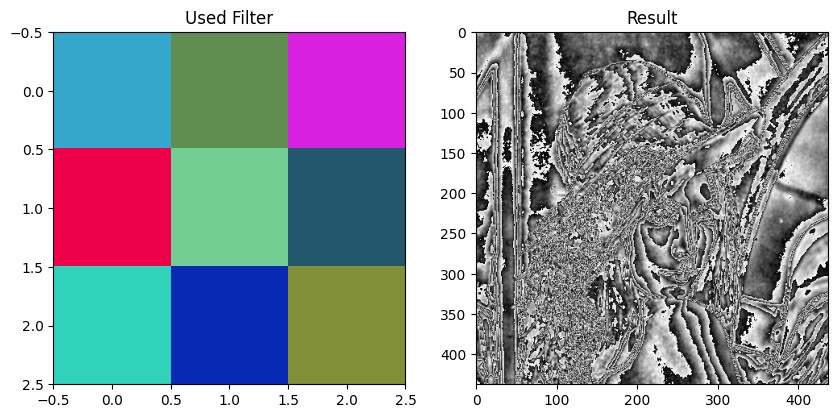

In [14]:
filtered_img1 = conv_op(img, filter1)
print(filtered_img1.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter1, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img1[0, 0, :, :], cmap='gray')
plt.show()

In [16]:
filter2 = np.random.rand(3, 3, 3)
print(filter2.shape)
print(filter2)

(3, 3, 3)
[[[0.60002618 0.52531504 0.45238246]
  [0.34179444 0.23380596 0.65055798]
  [0.08431994 0.23092558 0.68333935]]

 [[0.0773972  0.11052253 0.66045601]
  [0.42605567 0.05955002 0.83267804]
  [0.38455918 0.53312512 0.17102582]]

 [[0.17394    0.94760527 0.60636699]
  [0.68053488 0.26486252 0.77746845]
  [0.97668465 0.57511867 0.73976661]]]


(1, 1, 438, 438)


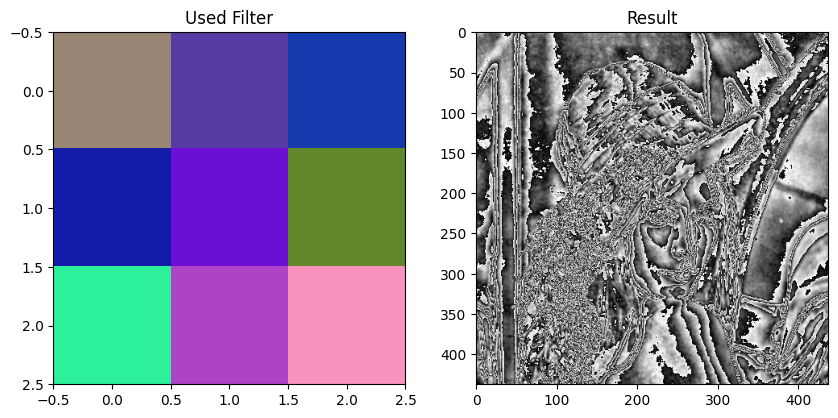

In [17]:
filtered_img2 = conv_op(img, filter2)
print(filtered_img2.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter2, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img2[0, 0, :, :], cmap='gray')
plt.show()

In [18]:
filter3 = np.random.rand(3, 3, 3)
print(filter3.shape)
print(filter3)

(3, 3, 3)
[[[0.35234566 0.80719916 0.76022705]
  [0.62949307 0.51941108 0.10273265]
  [0.89013728 0.23657447 0.34991824]]

 [[0.08301423 0.0985645  0.38185057]
  [0.92820109 0.63347722 0.14287343]
  [0.02425772 0.93524368 0.93849378]]

 [[0.89542524 0.42333483 0.73731205]
  [0.00699833 0.86929202 0.54965373]
  [0.90909269 0.88731741 0.62467185]]]


(1, 1, 438, 438)


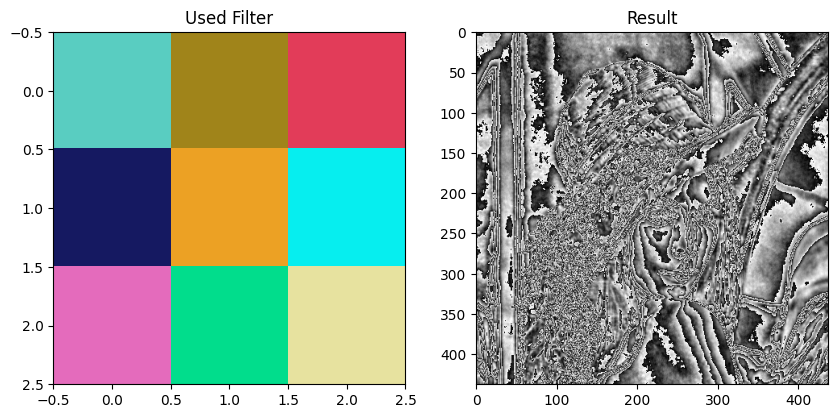

In [19]:
filtered_img3 = conv_op(img, filter3)
print(filtered_img3.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter3, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img3[0, 0, :, :], cmap='gray')
plt.show()

In [20]:
filter4 = np.random.rand(3, 3, 3)
print(filter4.shape)
print(filter4)

(3, 3, 3)
[[[0.93515284 0.42516911 0.65273919]
  [0.31543426 0.56647103 0.47175758]
  [0.25081893 0.5427025  0.22423834]]

 [[0.17500108 0.4155411  0.17324743]
  [0.62369828 0.02469091 0.19593214]
  [0.55303915 0.36149518 0.68534508]]

 [[0.74571626 0.39553554 0.30113971]
  [0.74604681 0.06796996 0.22397838]
  [0.54898009 0.06398006 0.44115159]]]


(1, 1, 438, 438)


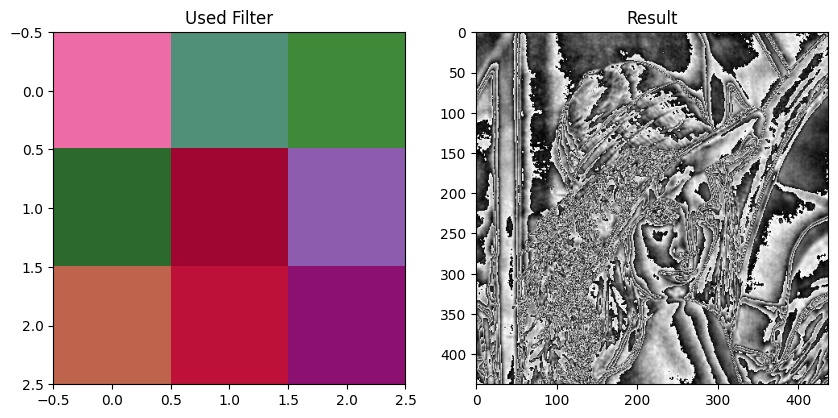

In [21]:
filtered_img4 = conv_op(img, filter4)
print(filtered_img4.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter4, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img4[0, 0, :, :], cmap='gray')
plt.show()

In [22]:
filter5 = np.random.rand(3, 3, 3)
print(filter5.shape)
print(filter5)

(3, 3, 3)
[[[0.37342902 0.97909231 0.37010073]
  [0.01577905 0.15456359 0.4912662 ]
  [0.64730797 0.60460907 0.80100781]]

 [[0.3298761  0.10593245 0.48506629]
  [0.77485651 0.96715514 0.10504378]
  [0.02877143 0.9673022  0.69439435]]

 [[0.18475973 0.37484247 0.6384619 ]
  [0.41600372 0.72447241 0.32639442]
  [0.60242373 0.05349959 0.77820988]]]


(1, 1, 438, 438)


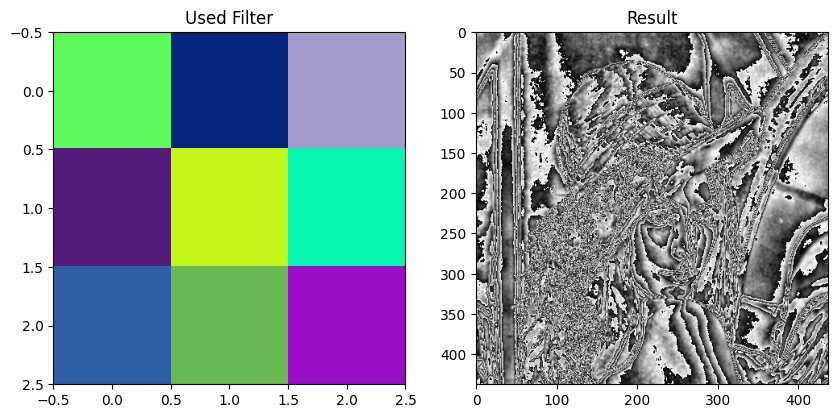

In [23]:
filtered_img5 = conv_op(img, filter5)
print(filtered_img5.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter5, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img5[0, 0, :, :], cmap='gray')
plt.show()

### 필터연산을 적용한 최종 결과

(1, 1, 438, 438)


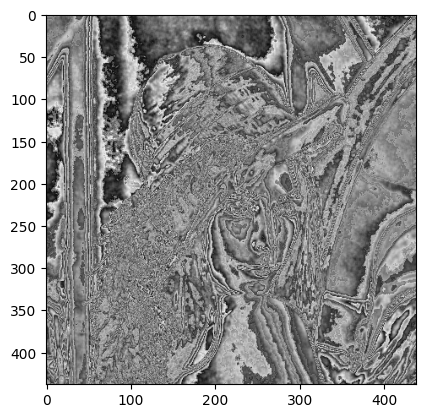

In [24]:
filtered_img = np.stack([filtered_img1, filtered_img2, filtered_img3, filtered_img4, filtered_img5]).sum(axis=0)

print(filtered_img.shape)
plt.imshow(filtered_img[0, 0, :, :], cmap='gray')
plt.show()

### 전체 과정 한번에 보기

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.6407514495107147..1.9634250169646124].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7201688082560667..1.9925713052811553].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.039940178522755..2.441719813587031].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7198605830142413..1.9994749849283326].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.3136237868316294..1.8832216580390868].


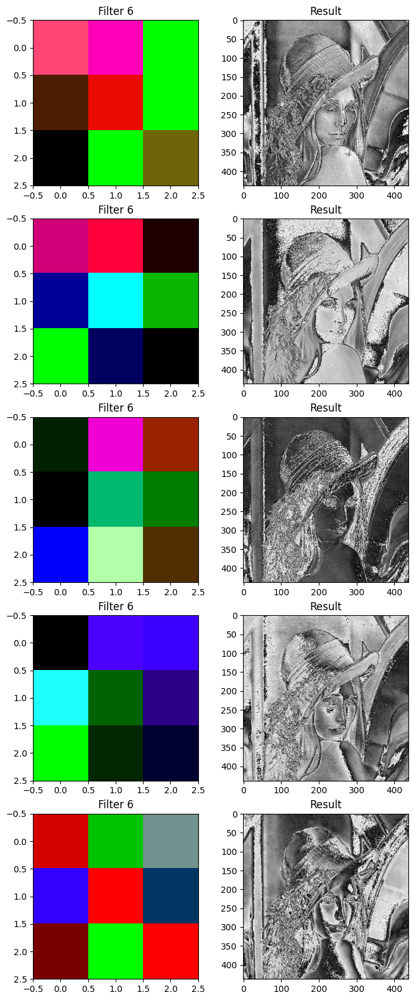

In [25]:
np.random.seed(222)

fig = plt.figure(figsize=(8, 20))

filter_num = 5
filtered_img = []

for i in range(filter_num):
    ax = fig.add_subplot(5, 2, 2*i+1)
    ax.title.set_text('Filter {}'.format(filter_num+1))

    filter = np.random.randn(3, 3, 3)
    plt.imshow(filter)

    ax = fig.add_subplot(5, 2, 2*i+2)
    ax.title.set_text('Result')

    filtered = conv_op(img, filter)
    filtered_img.append(filtered)
    plt.imshow(filtered[0, 0, :, :], cmap='gray')

plt.show()

(1, 1, 438, 438)


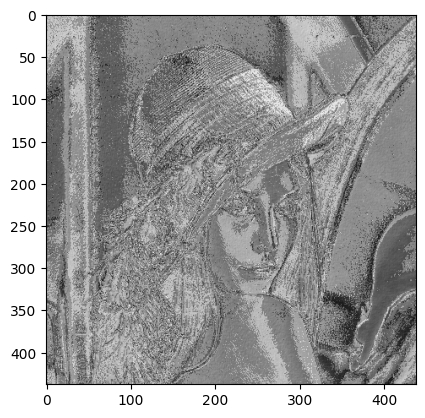

In [26]:
filtered_img = np.stack(filtered_img).sum(axis=0)

print(filtered_img.shape)
plt.imshow(filtered_img[0, 0, :, :], cmap='gray')
plt.show()

# 합성곱 신경망 구현
- 참고: 밑바닥부터 시작하는 딥러닝1

## 합성곱 층(Convolution Layer)

In [27]:
def im2col(input_data, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_data.shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1

    img = np.pad(input_data, [(0, 0), (0, 0), (pad, pad), (pad, pad)], 'constant')
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride*out_h
        for x in range(filter_w):
            x_max = x + stride*out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]

    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N*out_h*out_w, -1)
    return col

def col2im(col, input_shape, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2*pad + stride - 1, W + 2*pad + stride - 1))
    for y in range(filter_h):
        y_max = y + stride*out_h
        for x in range(filter_w):
            x_max = x + stride*out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]



In [28]:
class Conv2D:
    def __init__(self, W, b, stride=1, pad=0):
        self.W = W
        self.b = b
        self.stride = stride
        self.pad = pad

        self.input_data = None
        self.col = None
        self.col_W = None

        self.dW = None
        self.db = None

    def forward(self, input_data):
        FN, C, FH, FW = self.W.shape
        N, C, H, W = input_data.shape
        out_h = (H + 2*self.pad - FH) // self.stride + 1
        out_w = (W + 2*self.pad - FW) // self.stride + 1

        col = im2col(input_data, FH, FW, self.stride, self.pad)
        col_W = self.W.reshape(FN, -1).T

        out = np.dot(col, col_W) + self.b
        out = out.reshape(N, out_h, out_w, -1).transpose(0, 3, 1, 2)

        self.input_data = input_data
        self.col = col
        self.col_W = col_W
        return out

    def backward(self, dout):
        FN, C, FH, FW = self.W.shape
        dout = dout.transpose(0, 2, 3, 1).reshape(-1, FN)

        self.db = np.sum(dout, axis=0)
        self.dW = np.dot(self.col.T, dout)
        self.dW = self.dW.transpose(1, 0).reshape(FN, C, FH, FW)

        dcol = np.dot(dout, self.col_W.T)
        dx = col2im(dcol, self.input_data.shape, FH, FW, self.stride, self.pad)
        return dx


### 컨볼루션 레이어 테스트

In [29]:
def init_weight(num_filters, data_dim, kernel_size, stride=1, pad=0, weight_std=0.01):
    weights = np.random.randn(num_filters, data_dim, kernel_size, kernel_size) * weight_std
    biases = np.zeros(num_filters)

    return weights, biases

img shape: (440, 440, 1)


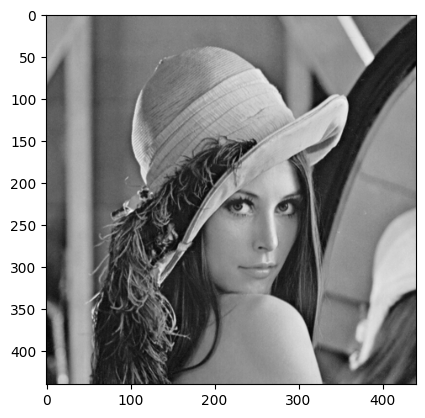

In [30]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img_gray = url_to_image(img_url, gray=True)
img_gray = img_gray.reshape(img_gray.shape[0], -1, 1)
print('img shape:', img_gray.shape)

img_gray = np.expand_dims(img_gray.transpose(2, 0, 1), axis=0)

plt.imshow(img_gray[0, 0, :, :], cmap='gray')
plt.show()

In [31]:
W, b = init_weight(1, 1, 3)
conv = Conv2D(W, b)
output = conv.forward(img_gray)

print('Conv Layer size:', output.shape)

Conv Layer size: (1, 1, 438, 438)


img shape: (440, 440, 1)


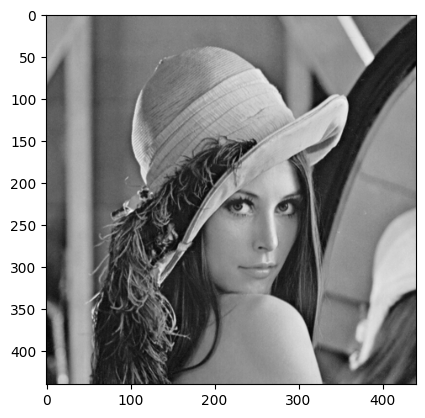

In [32]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img_gray = url_to_image(img_url, gray=True)
img_gray = img_gray.reshape(img_gray.shape[0], -1, 1)
print('img shape:', img_gray.shape)
img_gray = np.expand_dims(img_gray.transpose(2, 0, 1), axis=0)
plt.imshow(img_gray[0, 0, :, :], cmap='gray')
plt.show()

In [33]:
W, b = init_weight(1, 1, 3)
conv = Conv2D(W, b)
output = conv.forward(img_gray)

print('Conv Layer size:', output.shape)

Conv Layer size: (1, 1, 438, 438)


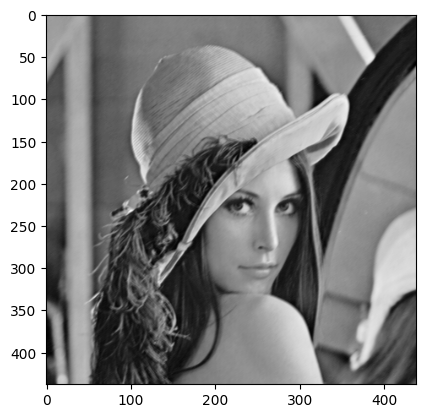

In [34]:
plt.imshow(output[0, 0, :, :], cmap='gray')
plt.show()

In [35]:
W2, b2 = init_weight(1, 1, 3, stride=2)
conv2 = Conv2D(W2, b2, stride=2)
output2 = conv2.forward(img_gray)

print('Conv Layer size:', output2.shape)

Conv Layer size: (1, 1, 219, 219)


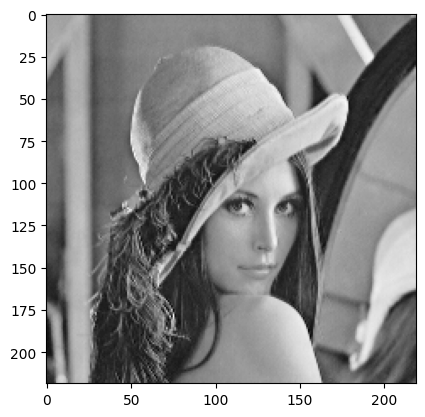

In [36]:
plt.imshow(output2[0, 0, :, :], cmap='gray')
plt.show()

img shape: (440, 440, 3)


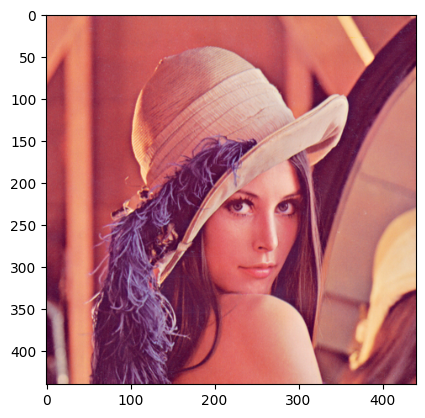

img.shape: (1, 3, 440, 440)


In [37]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img = url_to_image(img_url)
print('img shape:', img.shape)
plt.imshow(img)
plt.show()

img = np.expand_dims(img.transpose(2, 0, 1), axis=0)
print('img.shape:', img.shape)

In [38]:
W3, b3 = init_weight(10, 3, 3)
conv3 = Conv2D(W3, b3)
output3 = conv3.forward(img)

print('Conv Layer size:', output3.shape)

Conv Layer size: (1, 10, 438, 438)


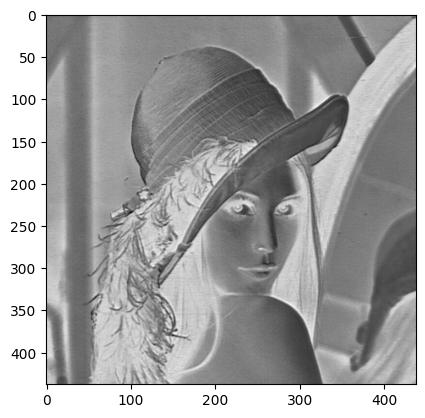

In [39]:
plt.imshow(output3[0, 3, :, :], cmap='gray')
plt.show()

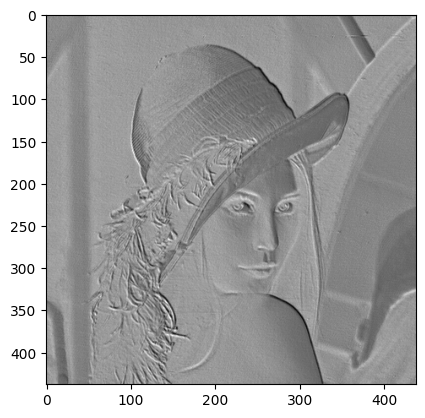

In [40]:
plt.imshow(output3[0, 0, :, :], cmap='gray')
plt.show()

### 동일한 이미지 여러 장 테스트 (배치 처리)

In [41]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img_gray = url_to_image(img_url, gray=True)
img_gray = img_gray.reshape(img_gray.shape[0], -1, 1)
print('img shape:', img_gray.shape)

img_gray = img_gray.transpose(2, 0, 1)
print('img_gray.shape:', img_gray.shape)

img shape: (440, 440, 1)
img_gray.shape: (1, 440, 440)


In [55]:
batch_img_gray = np.repeat(img_gray[np.newaxis, :, :, :], 15, axis=0)
print(batch_img_gray.shape)

(15, 1, 440, 440)


In [56]:
W4, b4 = init_weight(10, 1, 3, stride=2)
conv4 = Conv2D(W4, b4, stride = 2)
output4 = conv4.forward(batch_img_gray)

print('Conv Layer size:', output4.shape)

Conv Layer size: (15, 10, 219, 219)


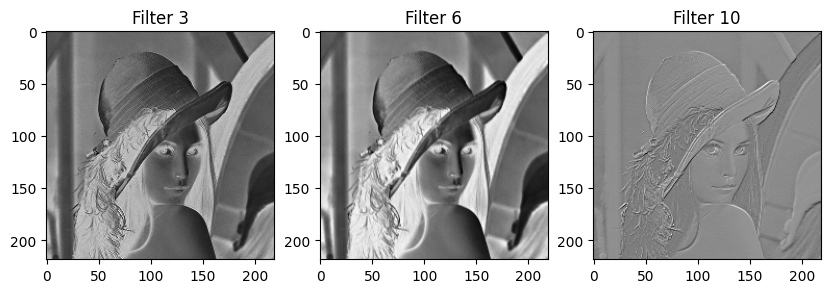

In [57]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Filter 3')
plt.imshow(output4[3, 2, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Filter 6')
plt.imshow(output4[3, 5, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Filter 10')
plt.imshow(output4[3, 9, :, :], cmap='gray')

plt.show()

In [58]:
W5, b5 = init_weight(32, 3, 3, stride=3)
conv5 = Conv2D(W5, b5, stride = 3)
output5 = conv5.forward(img)

print('Conv Layer size:', output5.shape)

Conv Layer size: (1, 32, 146, 146)


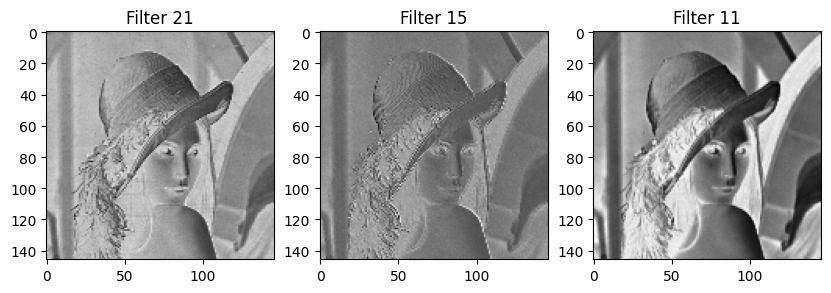

In [59]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Filter 21')
plt.imshow(output5[0, 20, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Filter 15')
plt.imshow(output5[0, 14, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Filter 11')
plt.imshow(output5[0, 10, :, :], cmap='gray')

plt.show()

### 동일한 이미지 배치처리(color)

img shape: (440, 440, 3)


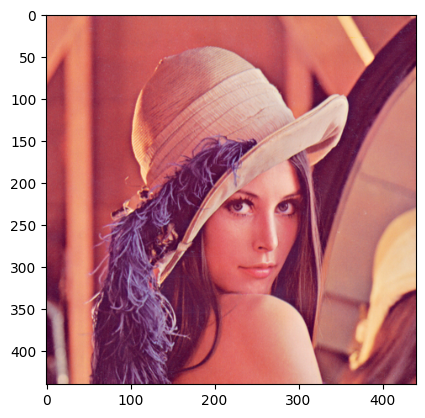

img.shape: (3, 440, 440)


In [60]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img = url_to_image(img_url)
print('img shape:', img.shape)
plt.imshow(img)
plt.show()


img = img.transpose(2, 0, 1)
print('img.shape:', img.shape)

In [61]:
batch_image_color = np.repeat(img[np.newaxis, :, :, :], 15, axis=0)
print(batch_image_color.shape)

(15, 3, 440, 440)


In [62]:
W6, b6 = init_weight(64, 3, 5)
conv6 = Conv2D(W6, b6)
output6 = conv6.forward(batch_image_color)

print('Conv Layer size:', output6.shape)

Conv Layer size: (15, 64, 436, 436)


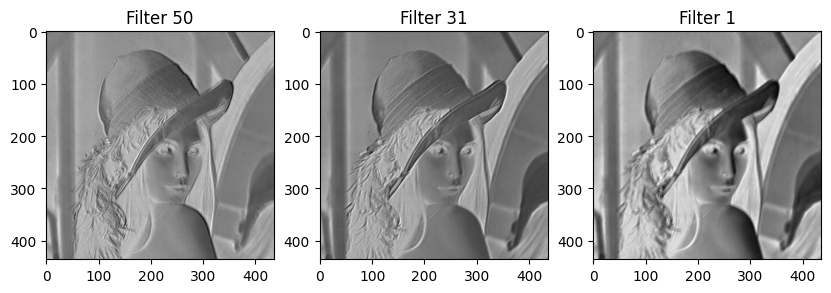

In [63]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Filter 50')
plt.imshow(output6[10, 49, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Filter 31')
plt.imshow(output6[10, 30, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Filter 1')
plt.imshow(output6[10, 0, :, :], cmap='gray')

plt.show()

## 풀링 층(Pooling Layer)

In [64]:
class Pooling2D:
    def __init__(self, kernel_size=2, stride=1, pad=0):
        self.kernel_size = kernel_size
        self.stride = stride
        self.pad = pad

        self.input_data = None
        self.arg_max = None

    def forward(self, input_data):
        N, C, H, W = input_data.shape
        out_h = (H - self.kernel_size) // self.stride + 1
        out_w = (W - self.kernel_size) // self.stride + 1

        col = im2col(input_data, self.kernel_size, self.kernel_size, self.stride, self.pad)
        col = col.reshape(-1, self.kernel_size*self.kernel_size)

        arg_max = np.argmax(col, axis=1)
        out = np.max(col, axis=1)
        output = out.reshape(N, out_h, out_w, C).transpose(0, 3, 1, 2)

        self.input_data = input_data
        self.arg_max = arg_max

        return output

    def backward(self, dout):
        dout = dout.transpose(0, 2, 3, 1)
        pool_size = self.kernel_size * self.kernel_size
        dmax = np.zeros((dout.size, pool_size))
        dmax[np.arange(self.arg_max.size), self.arg_max.flatten()] = dout.flatten()
        dmax = dmax.reshape(dout.shape + (pool_size,))

        dcol = dmax.reshape(dmax.shape[0] * dmax.shape[1] * dmax.shape[2], -1)
        dx = col2im(dcol, self.input_data.shape, self.kernel_size, self.kernel_size, self.stride, self.pad)

        return dx


### 풀링 레이어 테스트
- 2차원 이미지
  - (Height, Width, 1)

img shape: (440, 440, 1)


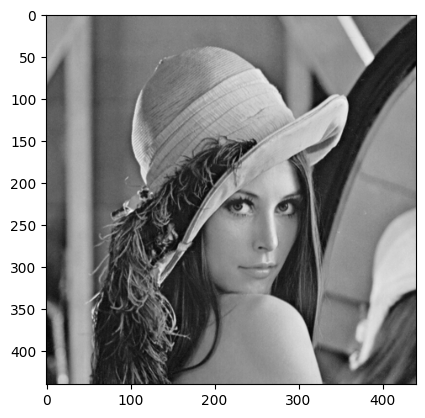

In [65]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img_gray = url_to_image(img_url, gray=True)
img_gray = img_gray.reshape(img_gray.shape[0], -1, 1)
print('img shape:', img_gray.shape)
img_gray = np.expand_dims(img_gray.transpose(2, 0, 1), axis=0)
plt.imshow(img_gray[0, 0, :, :], cmap='gray')
plt.show()

In [66]:
W, b = init_weight(8, 1, 3)
conv = Conv2D(W, b)
pool = Pooling2D(stride=2, kernel_size=2)
output1 = conv.forward(img_gray)

print('Conv Layer size:', output1.shape)

Conv Layer size: (1, 8, 438, 438)


In [67]:
output1 = pool.forward(output1)
print('Pooling Layer size:', output1.shape)

Pooling Layer size: (1, 8, 219, 219)


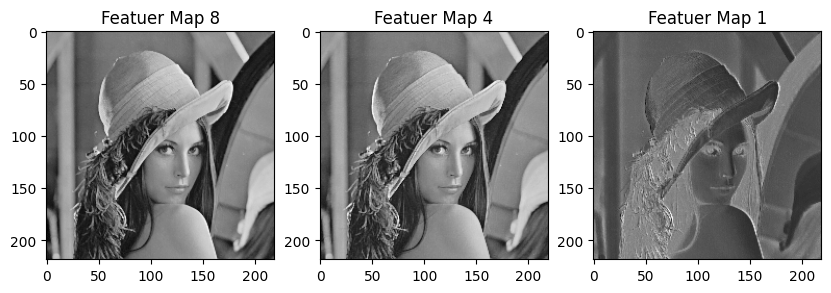

In [68]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Featuer Map 8')
plt.imshow(output1[0, 7, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Featuer Map 4')
plt.imshow(output1[0, 3, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Featuer Map 1')
plt.imshow(output1[0, 0, :, :], cmap='gray')

plt.show()

In [69]:
W2, b2 = init_weight(32, 1, 3, stride=2)
conv2 = Conv2D(W2, b2)
pool = Pooling2D(stride=2, kernel_size=2)
output2 = conv2.forward(img_gray)
output2 = pool.forward(output2)

print('Conv Layer size:', output2.shape)

Conv Layer size: (1, 32, 219, 219)


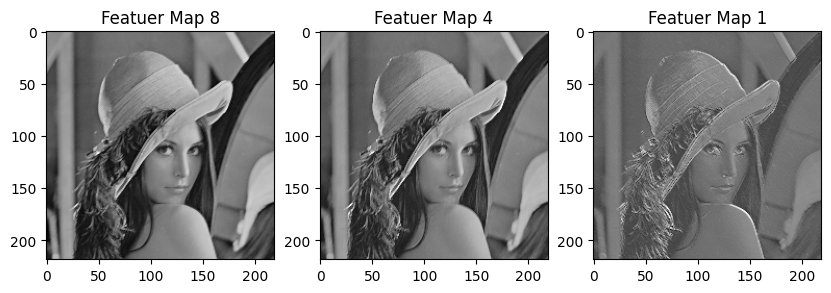

In [70]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Featuer Map 8')
plt.imshow(output2[0, 7, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Featuer Map 4')
plt.imshow(output2[0, 3, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Featuer Map 1')
plt.imshow(output2[0, 0, :, :], cmap='gray')

plt.show()

### 동일한 이미지 배치처리
- Color Image

- conv --> maxpooling --> conv --> maxpooling

- 시각화 과정
  - 5번째 이미지
  - [2, 5, 9] 필터를 통해 확인

img shape: (440, 440, 3)


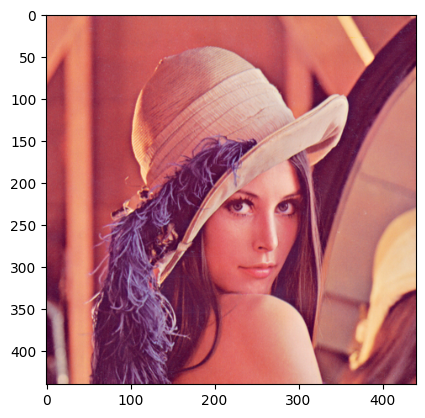

img.shape: (3, 440, 440)


In [71]:
img_url = 'https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png'

img = url_to_image(img_url)
print('img shape:', img.shape)
plt.imshow(img)
plt.show()


img = img.transpose(2, 0, 1)
print('img.shape:', img.shape)

In [72]:
batch_image_color = np.repeat(img[np.newaxis, :, :, :], 15, axis=0)
print(batch_image_color.shape)

(15, 3, 440, 440)


In [73]:
W, b = init_weight(10, 3, 3)
conv1 = Conv2D(W, b)
pool = Pooling2D(stride=2, kernel_size=2)
output1 = conv1.forward(batch_image_color)

print('Conv Layer size:', output1.shape)

Conv Layer size: (15, 10, 438, 438)


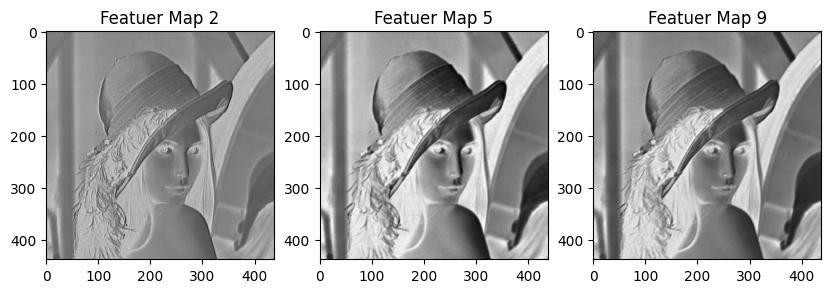

In [74]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Featuer Map 2')
plt.imshow(output1[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Featuer Map 5')
plt.imshow(output1[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Featuer Map 9')
plt.imshow(output1[4, 8, :, :], cmap='gray')

plt.show()

In [75]:
output1 = pool.forward(output1)
print('Pooling Layer size:', output1.shape)

Pooling Layer size: (15, 10, 219, 219)


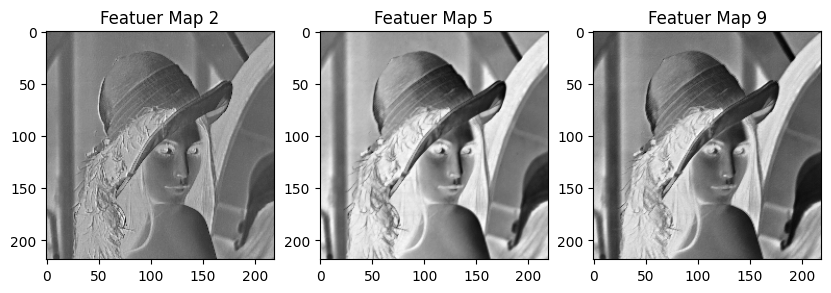

In [76]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Featuer Map 2')
plt.imshow(output1[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Featuer Map 5')
plt.imshow(output1[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Featuer Map 9')
plt.imshow(output1[4, 8, :, :], cmap='gray')

plt.show()

In [77]:
W2, b2 = init_weight(30, 10, 3)
conv2 = Conv2D(W2, b2)
pool = Pooling2D(stride=2, kernel_size=2)
output2 = conv2.forward(output1)
# output2 = pool.forward(output2)

print('Conv Layer size:', output2.shape)

Conv Layer size: (15, 30, 217, 217)


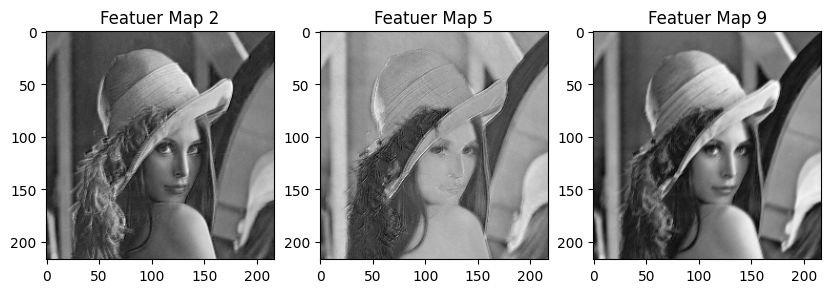

In [78]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Featuer Map 2')
plt.imshow(output2[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Featuer Map 5')
plt.imshow(output2[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Featuer Map 9')
plt.imshow(output2[4, 8, :, :], cmap='gray')

plt.show()

In [79]:
output2 = pool.forward(output2)

print('Conv Layer size:', output2.shape)

Conv Layer size: (15, 30, 108, 108)


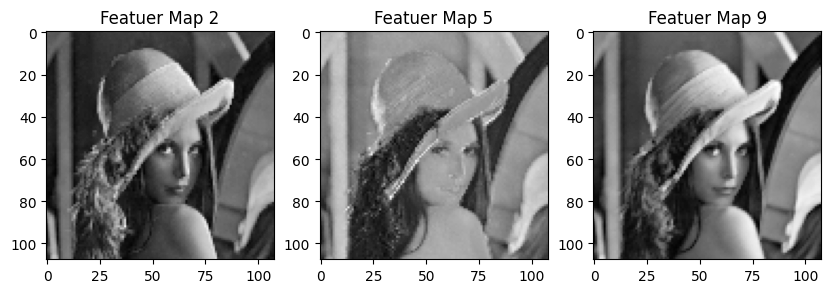

In [80]:
plt.figure(figsize=(10, 10))
plt.subplot(1, 3, 1)
plt.title('Featuer Map 2')
plt.imshow(output2[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title('Featuer Map 5')
plt.imshow(output2[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title('Featuer Map 9')
plt.imshow(output2[4, 8, :, :], cmap='gray')

plt.show()

# 대표적인 CNN 모델 소개

## LeNet - 5

<img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>

## AlexNet

- 활성화 함수로 **ReLU** 사용

- 국소적 정규화(Local Response normalization, LRN) 실시하는 계층 사용

- 드롭아웃

  <img src="https://miro.medium.com/proxy/1*qyc21qM0oxWEuRaj-XJKcw.png" width="800">

  <center>[AlexNet 구조]</center>

  <sub>출처: http://www.cs.toronto.edu/~hinton/absps/imagenet.pdf</sub>

## VGG - 16

- 모든 컨볼루션 레이어에서의 필터(커널) 사이즈를 **3x3**으로 설정

- 2x2 MaxPooling

- 필터의 개수는 Conv Block을 지나가면서 2배씩 증가  
  32 -> 64 -> 128

  <br>

  <img src="https://www.researchgate.net/profile/Jose_Cano31/publication/327070011/figure/fig1/AS:660549306159105@1534498635256/VGG-16-neural-network-architecture.png" width="800">

  <center>[VGG-16 구조]</center>

  <sub>출처: Very Deep Convolutional Networks for Large-Scale Image Recognition</sub>

# CNN 학습 구현 - MNIST

## modules import

In [98]:
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict

## Util Functions

In [82]:
def im2col(input_data, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_data.shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1

    img = np.pad(input_data, [(0, 0), (0, 0), (pad, pad), (pad, pad)], 'constant')
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride*out_h
        for x in range(filter_w):
            x_max = x + stride*out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]

    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N*out_h*out_w, -1)
    return col

def col2im(col, input_shape, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2*pad + stride - 1, W + 2*pad + stride - 1))
    for y in range(filter_h):
        y_max = y + stride*out_h
        for x in range(filter_w):
            x_max = x + stride*out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]

def softmax(x):
    if x.ndim == 2:
        x = x.T
        x = x - np.max(x, axis=0)
        y = np.exp(x) / np.sum(np.exp(x), axis=0)
        return y.T

    x = x - np.max(x) # 오버플로 대책
    return np.exp(x) / np.sum(np.exp(x))

def mean_squared_error(y, t):
    return 0.5 * np.sum((y-t)**2)

def cross_entropy_error(y, t):
    if y.ndim == 1:
      t = t.reshape(1, t.size)
      y = y.reshape(1, y.size)

    if t.size == y.size:
      t = t.argmax(axis=1)

    batch_size = y.shape[0]
    return -np.sum(np.log(y[np.arange(batch_size), t] + 1e-7)) / batch_size

def softmax_loss(x, y):
    pred_y = softmax(x)
    return cross_entropy_error(pred_y, y)


## Util Classes

In [83]:
class ReLU:
    def __init__(self):
        self.mask = None

    def forward(self, x):
        self.mask = (x <= 0)
        out = x.copy()
        out[self.mask] = 0
        return out

    def backward(self, dout):
        dout[self.mask] = 0
        dx = dout
        return dx

class Sigmoid:
    def __init__(self):
        self.out = None

    def forward(self, x):
        out = 1 / (1 + np.exp(-x))
        self.out = out

        return out

class Layer:
    def __init__(self, W, b):
        self.W = W
        self.b = b

        self.input_data = None
        self.input_data_shape = None

        self.dW = None
        self.db = None

    def forward(self, input_data):
        self.input_data_shape = input_data.shape
        input_data = input_data.reshape(input_data.shape[0], -1)
        self.input_data = input_data

        out = np.dot(self.input_data, self.W) + self.b

        return out

    def backward(self, dout):
        dx = np.dot(dout, self.W.T)
        self.dW = np.dot(self.input_data.T, dout)
        self.db = np.sum(dout, axis=0)
        dx = dx.reshape(*self.input_data_shape)

        return dx

class Softmax:
    def __init__(self):
        self.loss = None
        self.y = None
        self.t = None

    def forward(self, x, t):
        self.t = t
        self.y = softmax(x)
        self.loss = cross_entropy_error(self.y, self.t)

        return self.loss

    def backward(self, dout=1):
        batch_size = self.t.shape[0]
        if self.t.size == self.y.size:
            dx = (self.y - self.t) / batch_size
        else:
            dx = self.y.copy()
            dx[np.arange(batch_size), self.t] -= 1
            dx = dx / batch_size

        return dx

In [84]:
class SGD:
    def __init__(self, lr=0.01):
        self.lr = lr

    def update(self, params, grads):
        for key in params.keys():
            params[key] -= self.lr * grads[key]


In [ ]:
class Adam:
  def __init__(self, lr=0.001, beta1=0.9, beta2=0.999):
    self.lr = lr
    self.beta1 = beta1
    self.beta2 = beta2
    self.iter = 0
    self.m = None
    self.v = None

  def update(self, params, grads):
    if self.m is None:
      self.m, self.v = {}, {}
      for key, val in params.items():
        self.m[key] = np.zeros_like(val)
        self.v[key] = np.zeros_like(val)

    self.iter += 1
    lr_t = self.lr * np.sqrt(1.0 - self.beta2 ** self.iter) / (1.0 - self.beta1 ** self.iter)

    for key in params.keys():
      self.m[key] += (1 - self.beta1) * (grads[key] - self.m[key])
      self.v[key] += (1 - self.beta2) * (grads[key] ** 2 - self.v[key])

      params[key] -= lr_t * self.m[key] / (np.sqrt(self.v[key]) + 1e-7)

## 데이터 로드

In [162]:
np.random.seed(42)

(x_train, y_train), (x_test, y_test) = mnist.load_data()
num_classes = 10

In [163]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(60000, 28, 28)
(60000,)
(10000, 28, 28)
(10000,)


In [164]:
x_train, x_test = np.expand_dims(x_train, axis=1), np.expand_dims(x_test, axis=1)

In [165]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(60000, 1, 28, 28)
(60000,)
(10000, 1, 28, 28)
(10000,)


In [166]:
total_size= 10000


x_train = x_train[:total_size]
x_test = x_test[:total_size]
y_train = y_train[:total_size]
y_test = y_test[:total_size]

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(10000, 1, 28, 28)
(10000,)
(10000, 1, 28, 28)
(10000,)


## Bulid Model

In [167]:
## Hyper Parameters

kernel_size= 5
stride= 1
epochs = 20
train_size = x_train.shape[0]
batch_size = 100
lr = 1e-3
current_iter = 0
iter_per_epoch = max(train_size // batch_size, 1)
train_loss_list = []
train_acc_list = []
test_acc_list = []

In [168]:
class MyModel:
    def __init__(self, input_dim=(1, 28, 28), num_outputs=10):
        conv1_block = {'num_filters':30,
                      'kernel_size': kernel_size,
                      'stride':stride,
                      'pad':0}

        input_size = input_dim[1]
        conv_output_size = ((input_size - conv1_block['kernel_size'] + 2*conv1_block['pad']) // conv1_block['stride']) + 1
        pool_output_size = int(conv1_block['num_filters'] * (conv_output_size/2) * (conv_output_size/2))

        self.params = {}
        self.params['W1'], self.params['b1'] = self.__init_weight_conv(conv1_block['num_filters'], input_dim[0], kernel_size)
        self.params['W2'], self.params['b2'] = self.__init_weight_fc(pool_output_size, 256)
        self.params['W3'], self.params['b3'] = self.__init_weight_fc(256, num_outputs)

        self.layers = OrderedDict()
        self.layers['Conv1'] = Conv2D(self.params['W1'], self.params['b1'])
        self.layers['ReLU1'] = ReLU()
        self.layers['Pool1'] = Pooling2D(kernel_size=2, stride=2)
        self.layers['Affine1'] = Layer(self.params['W2'], self.params['b2'])
        self.layers['ReLU2'] = ReLU()
        self.layers['Affine2'] = Layer(self.params['W3'], self.params['b3'])
        self.last_layer = Softmax()

    def __init_weight_conv(self, num_filters, data_dim, kernel_size, stride=1, pad=0, weight_std=0.01):
        W = weight_std * np.random.randn(num_filters, data_dim, kernel_size, kernel_size)
        b = np.zeros(num_filters)

        return W, b

    def __init_weight_fc(self, input_size, output_size, weight_std=0.01):
        W = weight_std * np.random.randn(input_size, output_size)
        b = np.zeros(output_size)

        return W, b

    def forward(self, x):
        for layer in self.layers.values():
            x = layer.forward(x)

        return x

    def loss(self, x, y):
        y_pred = self.forward(x)
        return self.last_layer.forward(y_pred, y)

    def accuracy(self, x, t, batch_size=100):
        if t.ndim != 1 : t = np.argmax(t, axis=1)

        acc = 0.0

        for i in range(int(x.shape[0] / batch_size)):
            tx = x[i*batch_size:(i+1)*batch_size]
            tt = t[i*batch_size:(i+1)*batch_size]
            y_pred = self.forward(tx)
            y_pred = np.argmax(y_pred, axis=1)
            acc += np.sum(y_pred == tt)

        return acc / x.shape[0]

    def gradient(self, x, t):
        self.loss(x, t)

        dout = 1
        dout = self.last_layer.backward(dout)

        layers = list(self.layers.values())
        layers.reverse()
        for layer in layers:
            dout = layer.backward(dout)

        grads = {}
        grads['W1'], grads['b1'] = self.layers['Conv1'].dW, self.layers['Conv1'].db
        grads['W2'], grads['b2'] = self.layers['Affine1'].dW, self.layers['Affine1'].db
        grads['W3'], grads['b3'] = self.layers['Affine2'].dW, self.layers['Affine2'].db

        return grads

## 모델 생성 및 학습

In [169]:
model = MyModel()
model.params.keys()

dict_keys(['W1', 'b1', 'W2', 'b2', 'W3', 'b3'])

In [170]:
optimizer = Adam(lr)

In [171]:
for epoch in range(epochs):
    for i in range(iter_per_epoch):
        batch_mask = np.random.choice(train_size, batch_size)
        x_batch = x_train[batch_mask]
        y_batch = y_train[batch_mask]

        grads = model.gradient(x_batch, y_batch)
        optimizer.update(model.params, grads)

        loss = model.loss(x_batch, y_batch)
        train_loss_list.append(loss)

        x_train_sample, y_train_sample = x_train, y_train
        x_test_sample, y_test_sample = x_test, y_test

        train_acc = model.accuracy(x_train_sample, y_train_sample)
        test_acc = model.accuracy(x_test_sample, y_test_sample)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)

        current_iter += 1

    print('Epoch: {}, Train Loss: {:.4f}, Train Accuracy: {:.4f}, Test Accuracy: {:.4f}'.format(epoch, loss, train_acc, test_acc))

Epoch: 0, Train Loss: 0.0638, Train Accuracy: 0.9764, Test Accuracy: 0.9609
Epoch: 1, Train Loss: 0.0562, Train Accuracy: 0.9856, Test Accuracy: 0.9681
Epoch: 2, Train Loss: 0.0135, Train Accuracy: 0.9932, Test Accuracy: 0.9733


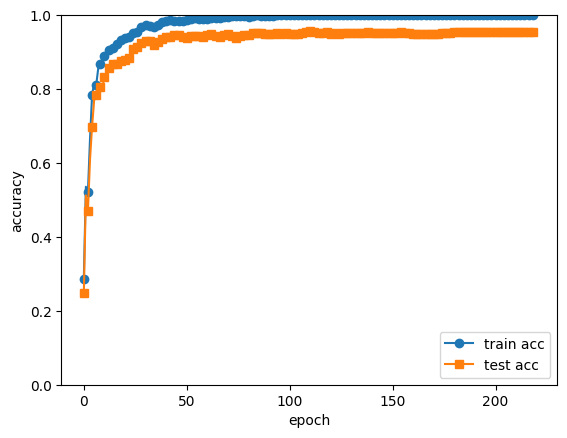

In [ ]:
x = np.arange(current_iter)
plt.plot(x, train_acc_list, marker='o', label='train acc', markevery=2)
plt.plot(x, test_acc_list, marker='s', label='test acc', markevery=2)
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.ylim(0, 1.0)
plt.legend(loc='lower right')
plt.show()

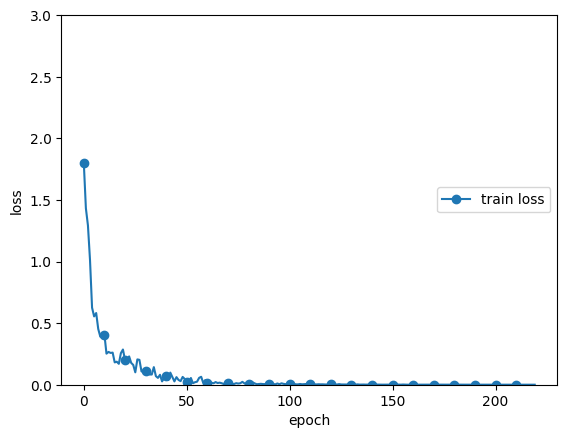

In [ ]:
x = np.arange(current_iter)
plt.plot(x, train_loss_list, marker='o', label='train loss', markevery=10)
plt.xlabel('epoch')
plt.ylabel('loss')
plt.ylim(0, 3.0)
plt.legend(loc='right')
plt.show()